# Analisis para Colombia

In [2]:
import pandas as pd
import os
from pathlib import Path
import numpy as np
import seaborn as sns
from datetime import date
from datetime import datetime
import matplotlib.pyplot as plt
from adjustText import adjust_text
from matplotlib.ticker import ScalarFormatter, FormatStrFormatter, FixedLocator, MultipleLocator
import locale
plt.style.use('Solarize_Light2')
locale.setlocale(locale.LC_TIME, 'es_ES.UTF-8');

## Dataset
## INS - Instituro Nacional de Salud

In [3]:
# CARGAMOS EL DATASET DE COVID-19 COLOMBIA Y LA LISTA CON MUNICIPIOS PDET
url = 'https://www.datos.gov.co/api/views/gt2j-8ykr/rows.csv?accessType=DOWNLOAD'
url2 = 'http://saludata.saludcapital.gov.co/osb/datos_abiertos_osb/enf-transmisibles/OSB_EnfTransm-COVID-19.csv'
pdet = pd.read_csv('data/MunicipiosPDET.csv')
censo = pd.read_csv('data/censo_municipal2018.csv')
datos = pd.read_csv(url)
bog = pd.read_csv(url2,encoding='iso-8859-1', sep=';', skiprows=4,skipfooter=2, parse_dates=['Fecha de diagnóstico'], dayfirst=True)

In [4]:
datos.head()

,ID de caso,Fecha de notificación,Código DIVIPOLA,Ciudad de ubicación,Departamento o Distrito,atención,Edad,Sexo,Tipo,Estado,...,FIS,Fecha de muerte,Fecha diagnostico,Fecha recuperado,fecha reporte web,Tipo recuperación,Codigo departamento,Codigo pais,Pertenencia etnica,Nombre grupo etnico
0,1,2020-03-02T00:00:00.000,11001,Bogotá D.C.,Bogotá D.C.,Recuperado,19,F,Importado,Leve,...,2020-02-27T00:00:00.000,NaN,2020-03-06T00:00:00.000,2020-03-13T00:00:00.000,2020-03-06T00:00:00.000,PCR,11,380.0,Otro,NaN
1,2,2020-03-06T00:00:00.000,76111,Guadalajara de Buga,Valle del Cauca,Recuperado,34,M,Importado,Leve,...,2020-03-04T00:00:00.000,NaN,2020-03-09T00:00:00.000,2020-03-19T00:00:00.000,2020-03-09T00:00:00.000,PCR,76,724.0,Otro,NaN
2,3,2020-03-07T00:00:00.000,5001,Medellín,Antioquia,Recuperado,50,F,Importado,Leve,...,2020-02-29T00:00:00.000,NaN,2020-03-09T00:00:00.000,2020-03-15T00:00:00.000,2020-03-09T00:00:00.000,PCR,5,724.0,Otro,NaN
3,4,2020-03-09T00:00:00.000,5001,Medellín,Antioquia,Recuperado,55,M,Relacionado,Leve,...,2020-03-06T00:00:00.000,NaN,2020-03-11T00:00:00.000,2020-03-26T00:00:00.000,2020-03-11T00:00:00.000,PCR,5,NaN,Otro,NaN
4,5,2020-03-09T00:00:00.000,5001,Medellín,Antioquia,Recuperado,25,M,Relacionado,Leve,...,2020-03-08T00:00:00.000,NaN,2020-03-11T00:00:00.000,2020-03-23T00:00:00.000,2020-03-11T00:00:00.000,PCR,5,NaN,Otro,NaN


## Variables de interes
### CASOS
1. fecha de reporte web
### MUERTES
2. Fecha de muerte

In [5]:
datos['Fecha de muerte'] = pd.to_datetime(datos['Fecha de muerte'])
datos['fecha reporte web'] = pd.to_datetime(datos['fecha reporte web'])
bog['Fecha de diagnóstico'] = pd.to_datetime(bog['Fecha de diagnóstico'])

In [6]:
muertes = datos.groupby(['Fecha de muerte','Ciudad de ubicación'])['ID de caso'].count().unstack().fillna(0)
muertes_acumuladas = muertes.cumsum()

casos = datos.groupby(['fecha reporte web','Ciudad de ubicación'])['ID de caso'].count().unstack().fillna(0)
casos_acumulados = casos.cumsum()

bog_casos = bog.groupby(['Fecha de diagnóstico','Localidad de residencia'])['ID de caso'].count().unstack().fillna(0)
bog_casos_acu = bog_casos.cumsum()

pdet_1 = datos[datos['Código DIVIPOLA'].isin(pdet['CodigoMunicipio'])]
pdet_1 = pdet_1.merge(pdet, how='left', left_on = 'Código DIVIPOLA', right_on='CodigoMunicipio')
pdet_casos = pdet_1.groupby(['fecha reporte web','NombreSubregion'])['ID de caso'].count().unstack().fillna(0)
pdet_casos_acumulados = pdet_casos.cumsum()

pdet_muertes = pdet_1.groupby(['Fecha de muerte','NombreSubregion'])['ID de caso'].count().unstack().fillna(0)
pdet_muertes_acumuladas = pdet_muertes.cumsum()

pdet_casos.tail()

NombreSubregion,ALTO PATÍA Y NORTE DEL CAUCA,ARAUCA,BAJO CAUCA Y NORDESTE ANTIOQUEÑO,CATATUMBO,CHOCÓ,CUENCA DEL CAGUÁN Y PIEDEMONTE CAQUETEÑO,MACARENA GUAVIARE,MONTES DE MARÍA,PACÍFICO MEDIO,PACÍFICO Y FRONTERA NARIÑENSE,PUTUMAYO,SIERRA NEVADA-PERIJÁ-ZONA BANANERA,SUR DE BOLÍVAR,SUR DE CÓRDOBA,SUR DEL TOLIMA,URABÁ ANTIOQUEÑO
fecha reporte web,,,,,,,,,,,,,,,,
2020-07-10,23.0,2.0,26.0,5.0,4.0,5.0,0.0,12.0,27.0,27.0,8.0,128.0,5.0,4.0,0.0,54.0
2020-07-11,9.0,0.0,4.0,2.0,6.0,11.0,0.0,4.0,9.0,7.0,38.0,115.0,0.0,2.0,1.0,39.0
2020-07-12,20.0,0.0,11.0,2.0,16.0,15.0,0.0,6.0,4.0,7.0,7.0,61.0,1.0,2.0,1.0,60.0
2020-07-13,8.0,1.0,7.0,0.0,2.0,6.0,0.0,1.0,10.0,4.0,1.0,94.0,1.0,7.0,0.0,19.0
2020-07-14,13.0,0.0,12.0,1.0,5.0,6.0,0.0,4.0,54.0,7.0,17.0,106.0,9.0,3.0,0.0,33.0


In [7]:
pdet_casos_acumulados.reset_index(drop=True).columns

Index(['ALTO PATÍA Y NORTE DEL CAUCA', 'ARAUCA',
       'BAJO CAUCA Y NORDESTE ANTIOQUEÑO', 'CATATUMBO', 'CHOCÓ',
       'CUENCA DEL CAGUÁN Y PIEDEMONTE CAQUETEÑO', 'MACARENA GUAVIARE',
       'MONTES DE MARÍA', 'PACÍFICO MEDIO', 'PACÍFICO Y FRONTERA NARIÑENSE',
       'PUTUMAYO', 'SIERRA NEVADA-PERIJÁ-ZONA BANANERA', 'SUR DE BOLÍVAR',
       'SUR DE CÓRDOBA', 'SUR DEL TOLIMA', 'URABÁ ANTIOQUEÑO'],
      dtype='object', name='NombreSubregion')

Organizemos el dataframe por orden de cantidad de casos o muertes

In [8]:
def rollingCases(df, cases, cantidad):
    df_append = pd.DataFrame()
    df = df.rolling(7, min_periods=1, win_type='gaussian').mean(std=2)
    df.reset_index(drop=True, inplace=True)
    df =  df.reindex( columns=df.tail(7).mean().sort_values(ascending=False).index)
    #df = df.sort_values(axis=1, by=df.index[-7:-1].mean(), ascending=False).reset_index(drop=True)
    for ciudad in range(cantidad):
        df_temp = pd.DataFrame()
        # Se toma el indice desde que los casos superan X cantidad
        first_value = df[ df.iloc[:,ciudad] >= cases ].iloc[:,ciudad].head(1)
        if not first_value.empty:
            idx = first_value.index[0]
            df_temp['datos'] = df.iloc[idx:,ciudad]
            df_temp['ciudad'] = df.columns[ciudad]
            df_temp.reset_index(inplace=True)
            df_append = pd.concat([df_append, df_temp])
    return df_append


In [9]:
sns.set()
def graficar(df,titulo,xlabel,ylabel,texto):
    text = []
    ciudades = df['ciudad'].unique()
    #plt.style.use('fivethirtyeight')
    #plt.style.use('ggplot')
    plt.style.use('Solarize_Light2')
    plt.figure(figsize=(16,9), dpi=500)
    plt.margins(0.005,0.05)
    for ciudad in ciudades:
        if not ciudad == 'Sin Dato':
            y = df[df['ciudad']==ciudad]['datos']
            fig = sns.lineplot(x = y.index, y = y, data = df, legend=False)  
            if ciudad == 'Bogotá D.C.':
                ciudad = 'Bogotá'
            elif ciudad == 'San Andrés de Tumaco':
                ciudad = 'Tumaco'
            elif ciudad == 'Cartagena de Indias':
                ciudad = 'Cartagena'
            if ciudad == 'SIERRA NEVADA-PERIJÁ-ZONA BANANERA':
                pos = (-250,3)
            else:
                pos = (5,1)
            size = 16
            fig.annotate(ciudad, 
                xy=(y.index[-1], y.iloc[-1]), 
                xytext=pos, 
                color= plt.gca().lines[-1].get_color() ,  
                textcoords="offset points",
                size=size, va="center",weight='bold')
        #adjust_text(text)   
    ax = plt.gca()
    ax.set_yscale('log')
    ax.yaxis.set_major_formatter(FormatStrFormatter('%.0f'))
    ax.yaxis.set_major_locator(FixedLocator([1,3,5,10,30,50,100,300,500,1000,3000,5000,10000,30000,50000,100000,300000,500000,1000000]))
    ax.xaxis.set_major_locator(MultipleLocator(10))
    plt.xlabel(xlabel, fontsize=18, weight='bold')
    plt.ylabel(ylabel, fontsize=16, weight='bold')
    plt.title(titulo, fontsize=18, weight='bold')
    plt.gcf().text(0.55, 0.15, texto, fontsize=10)
    plt.savefig(f'{carpeta}{titulo}.png', facecolor='w', bbox_inches='tight')
    plt.show()

In [10]:
num_casos_acu = 100
num_casos_diarios = 30

num_muertes_acu = 10
num_muertes_diarias = 3

can_casos_acu = 10
can_muertes_acu = 10
can_casos_diarios = 10
can_muertes_diarias = 10

pdet_num_casos_acu = 30
pdet_num_muertes_acu = 3
pdet_num_casos_diarios = 10
pdet_num_muertes_diarias = 3

localidades = 10
dep_pdet = 10

In [11]:
fecha = date.today()
fecha_cool = datetime.strftime(fecha,'%B %d')
fecha = str(fecha)
texto_col = f'Instituto Nacional de Salud - @JairoTorregrose - {fecha_cool}'
texto_bog = f'SALUDATA - @JairoTorregrose - {fecha_cool}'
carpeta = f'maps/{fecha}/'
Path(carpeta).mkdir(parents=True, exist_ok=True)

In [12]:
titulo_casos_acumulados = f'TOP {can_casos_acu} ciudades en Colombia con Casos Acumulados'
xlabel_casos_acumulados = f'Número de días desde los primeros {num_casos_acu} casos'
ylabel_casos_acumulados = 'Casos acumulados'

titulo_casos_diarios = f'TOP {can_casos_diarios} ciudades en Colombia con Casos Diarios'
xlabel_casos_diarios = f'Número de días desde los primeros {num_casos_diarios} casos diarios'
ylabel_casos_diarios = 'Casos diarios'

titulo_muertes_acumuladas = f'TOP {can_muertes_acu} ciudades en Colombia con Muertes Acumuladas'
xlabel_muertes_acumuladas = f'Número de días desde las primeras {num_muertes_acu} muertes'
ylabel_muertes_acumuladas = 'Muertes acumuladas'

titulo_muertes_diarias = f'TOP {can_muertes_diarias} ciudades en Colombia con Muertes Diarias'
xlabel_muertes_diarias = f'Número de días desde las primeras {num_muertes_diarias} muertes diarias'
ylabel_muertes_diarias = 'Muertes diarias'

In [13]:
titulo_diarios = f'TOP {localidades} localidades en Bogotá con Casos Diarios'
xlabel_diarios = f'Número de días desde los primeros {num_casos_diarios} casos diarios'
ylabel_diarios = 'Casos diarios'

titulo_acu = f'TOP {localidades} localidades en Bogotá con Casos Acumulados'
xlabel_acu = f'Número de días desde los primeros {num_casos_acu} casos'
ylabel_acu = 'Casos acumulados'

In [14]:
titulo_muertes_acumuladas_pdet = f'TOP {dep_pdet} sub-regiones PDET con Muertes Acumuladas'
xlabel_muertes_acumuladas_pdet = f'Número de días desde las primeras {pdet_num_muertes_acu} muertes'
ylabel_muertes_acumuladas_pdet = 'Muertes acumuladas'

titulo_casos_acumulados_pdet = f'TOP {dep_pdet} sub-regiones PDET con Casos Acumulados'
xlabel_casos_acumulados_pdet = f'Número de días desde los primeros {pdet_num_casos_acu} casos'
ylabel_casos_acumulados_pdet = 'Casos acumulados'

titulo_casos_diarios_pdet = f'TOP {dep_pdet} sub-regiones PDET con Casos Diarios'
xlabel_casos_diarios_pdet = f'Número de días desde los primeros {pdet_num_casos_diarios} casos diarios'
ylabel_casos_diarios_pdet = 'Casos diarios'


In [15]:
df_casos_acum = rollingCases(casos_acumulados, cases=num_casos_acu, cantidad=can_casos_acu)
df_muertes_acum = rollingCases(muertes_acumuladas, cases=num_muertes_acu, cantidad=can_muertes_acu)

df_casos_diarios = rollingCases(casos, cases=num_casos_diarios, cantidad=can_casos_diarios)
df_muertes_diarias = rollingCases(muertes, cases=num_muertes_diarias, cantidad=can_muertes_diarias)

df_bog_casos = rollingCases(bog_casos, cases=num_casos_diarios, cantidad=localidades)
df_bog_casos_acu = rollingCases(bog_casos_acu, cases=num_casos_acu, cantidad=localidades)

df_casos_acum_pdet = rollingCases(pdet_casos_acumulados, cases=pdet_num_casos_acu, cantidad=dep_pdet)
df_muertes_acum_pdet = rollingCases(pdet_muertes_acumuladas, cases=pdet_num_muertes_acu, cantidad=dep_pdet)

df_casos_diarios_pdet = rollingCases(pdet_casos, cases=pdet_num_casos_diarios, cantidad=dep_pdet)


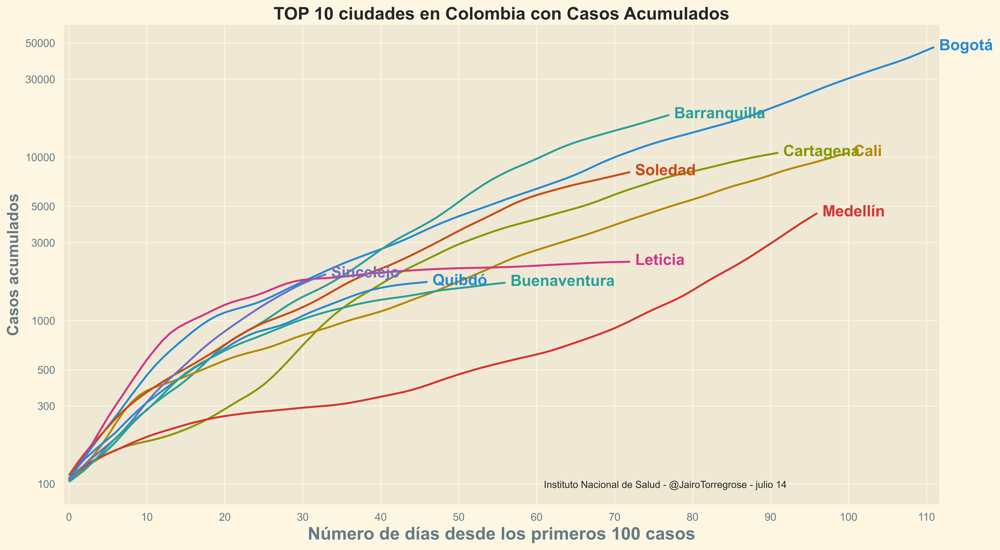

In [15]:
graficar(df_casos_acum, titulo_casos_acumulados,xlabel_casos_acumulados,ylabel_casos_acumulados ,texto_col)

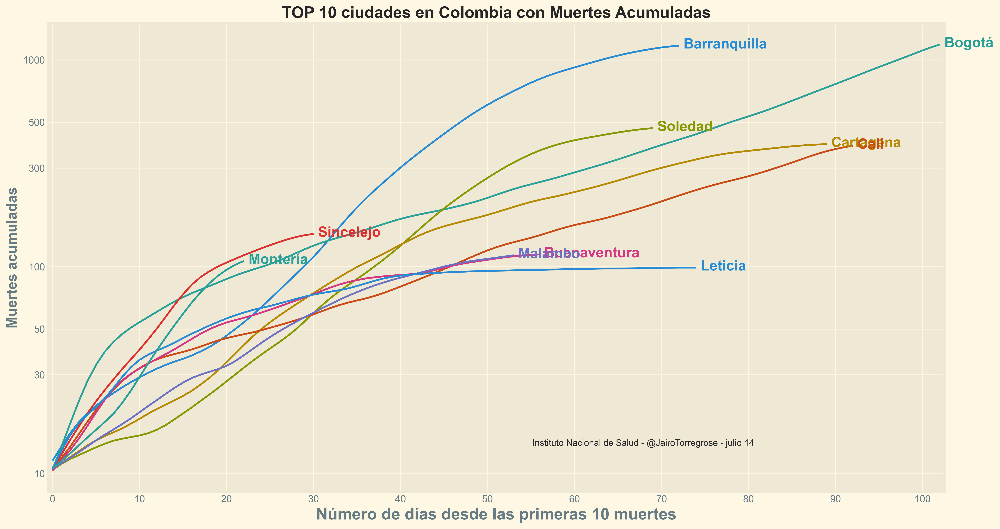

In [63]:
graficar(df_muertes_acum, titulo_muertes_acumuladas,xlabel_muertes_acumuladas,ylabel_muertes_acumuladas,texto_col)

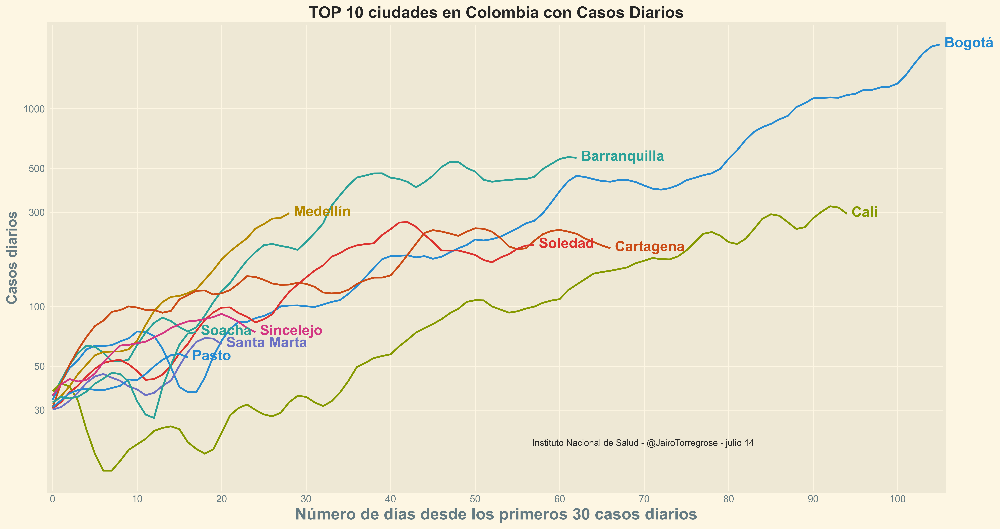

In [62]:
graficar(df_casos_diarios, titulo_casos_diarios, xlabel_casos_diarios, ylabel_casos_diarios,texto_col)

In [18]:
#graficar(df_muertes_diarias, titulo_muertes_diarias, xlabel_muertes_diarias, ylabel_muertes_diarias,texto_col)

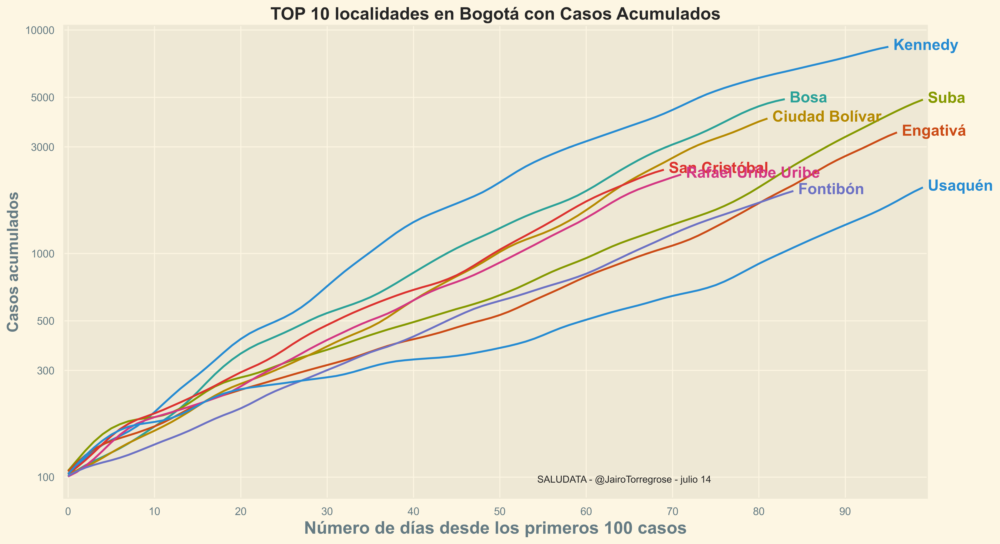

In [19]:
graficar(df_bog_casos_acu, titulo_acu, xlabel_acu, ylabel_acu ,texto_bog)

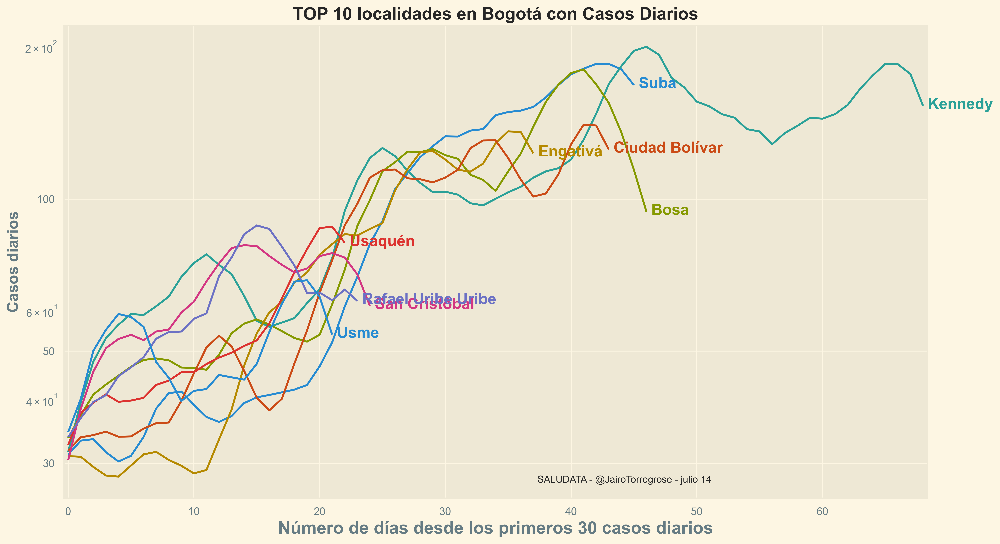

In [20]:
graficar(df_bog_casos, titulo_diarios, xlabel_diarios, ylabel_diarios , texto_bog)

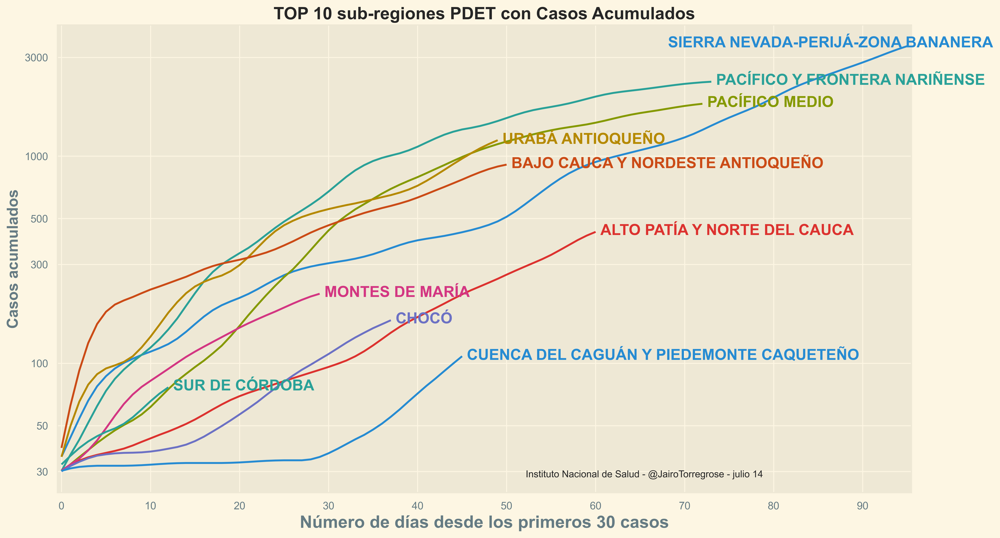

In [22]:
graficar(df_casos_acum_pdet, titulo_casos_acumulados_pdet,xlabel_casos_acumulados_pdet, ylabel_casos_acumulados_pdet,texto_col)

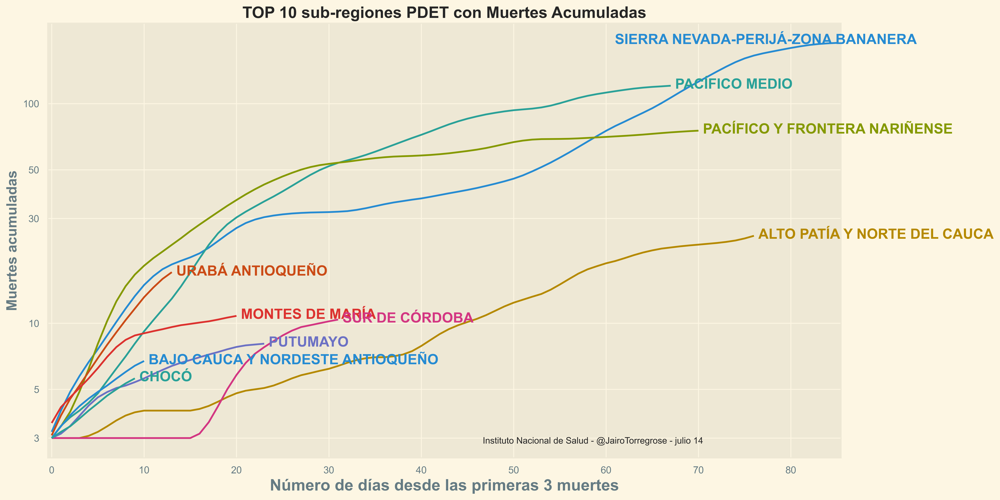

In [24]:
graficar(df_muertes_acum_pdet,titulo_muertes_acumuladas_pdet,xlabel_muertes_acumuladas_pdet,ylabel_muertes_acumuladas_pdet,texto_col)

In [26]:
#graficar(df_casos_diarios_pdet,titulo_casos_diarios_pdet,xlabel_casos_diarios_pdet,ylabel_casos_diarios_pdet,texto_col)

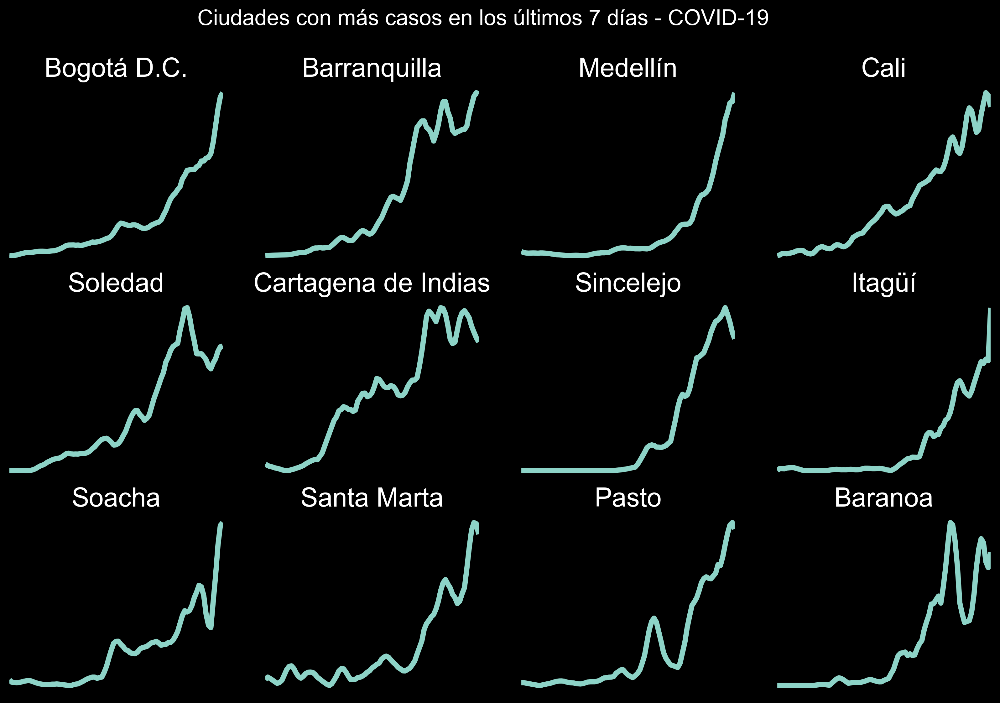

In [60]:
plt.style.use('dark_background')
diarios = casos.reindex( columns=casos.tail(7).mean().sort_values(ascending=False).index)
acumulados = diarios.cumsum()
titulo = 'Ciudades con más casos en los últimos 7 días - COVID-19'
ciudades = diarios.columns[:12]
plt.figure(figsize=(12,8), dpi=300)
for i, ciudad in enumerate(ciudades):
    plt.subplot(3,4,i+1)
    fig = diarios.iloc[-91:,i].rolling(7, min_periods=1, win_type='gaussian').mean(std=2).plot()
    fig.set_title(ciudad)
    fig.axis('off')
plt.suptitle(titulo)
plt.savefig(f'{carpeta}{titulo}.png', bbox_inches='tight')
plt.show()

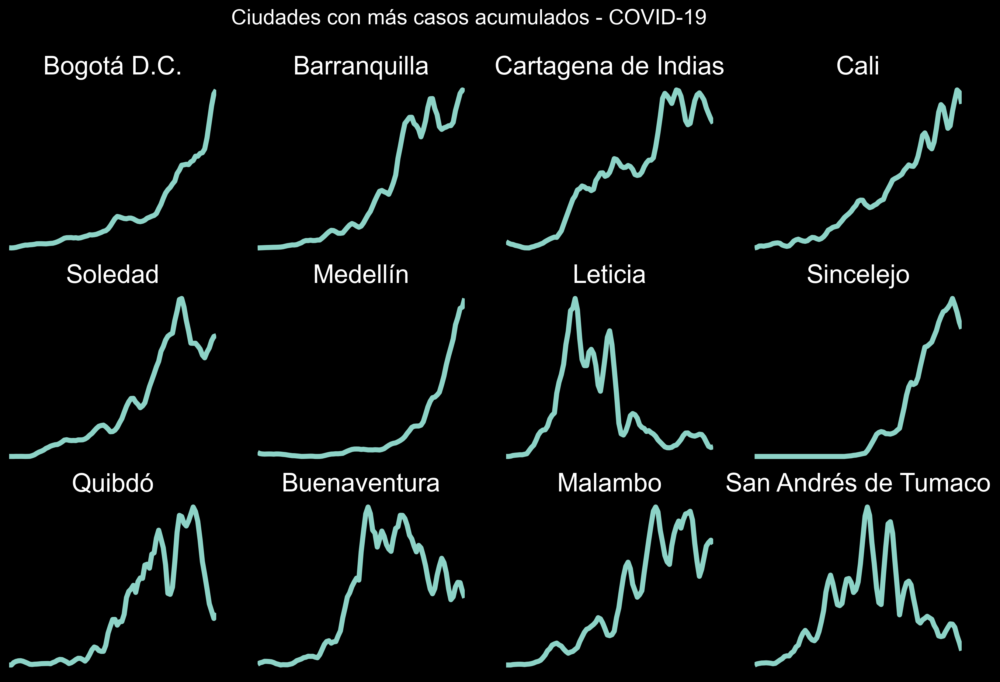

In [35]:
plt.style.use('dark_background')
diarios = casos.reindex( columns=casos.cumsum().tail(7).mean().sort_values(ascending=False).index)
acumulados = diarios.cumsum()
titulo = 'Ciudades con más casos acumulados - COVID-19'
ciudades = diarios.columns[:12]
plt.figure(figsize=(12,8), dpi=300)
for i, ciudad in enumerate(ciudades):
    plt.subplot(3,4,i+1)
    fig = diarios.iloc[-91:,i].rolling(7, min_periods=1, win_type='gaussian').mean(std=2).plot(color='r')
    fig.set_title(ciudad)
    fig.axis('off')
plt.suptitle(titulo)
plt.savefig(f'{carpeta}{titulo}.png', bbox_inches='tight')
plt.show()

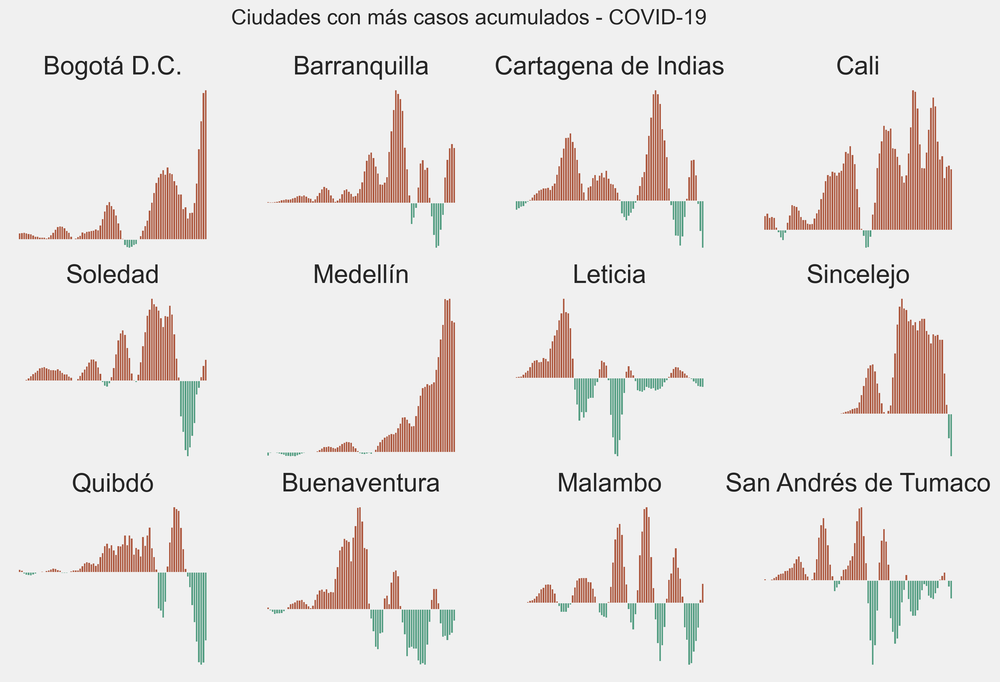

In [57]:
sns.set()
plt.style.use('fivethirtyeight')
diarios = casos.reindex( columns=casos.cumsum().tail(7).mean().sort_values(ascending=False).index)
acumulados = diarios.cumsum()
titulo = 'Cambio semanal en número de casos diarios - COVID-19'
ciudades = diarios.columns[:12]
plt.figure(figsize=(12,8), dpi=300)
for i, ciudad in enumerate(ciudades):
    fig = plt.subplot(3,4,i+1)
    df = diarios.iloc[-91:,i].rolling(7, min_periods=1, win_type='gaussian').mean(std=2)
    df = (df - df.shift(7)).dropna()
    #fig = sns.barplot(x = df.index, y = df , data=df)
    plt.bar(df[df>0].index, df[df>0].values, color='#ae5a41',width=1)
    plt.bar(df[df<=0].index, df[df<=0].values, color='#559e83',width=1)
    #fig = df.plot.bar()
    fig.set_title(ciudad)
    fig.axis('off')
plt.suptitle(titulo)
plt.savefig(f'{carpeta}{titulo}.png', bbox_inches='tight')
plt.show()

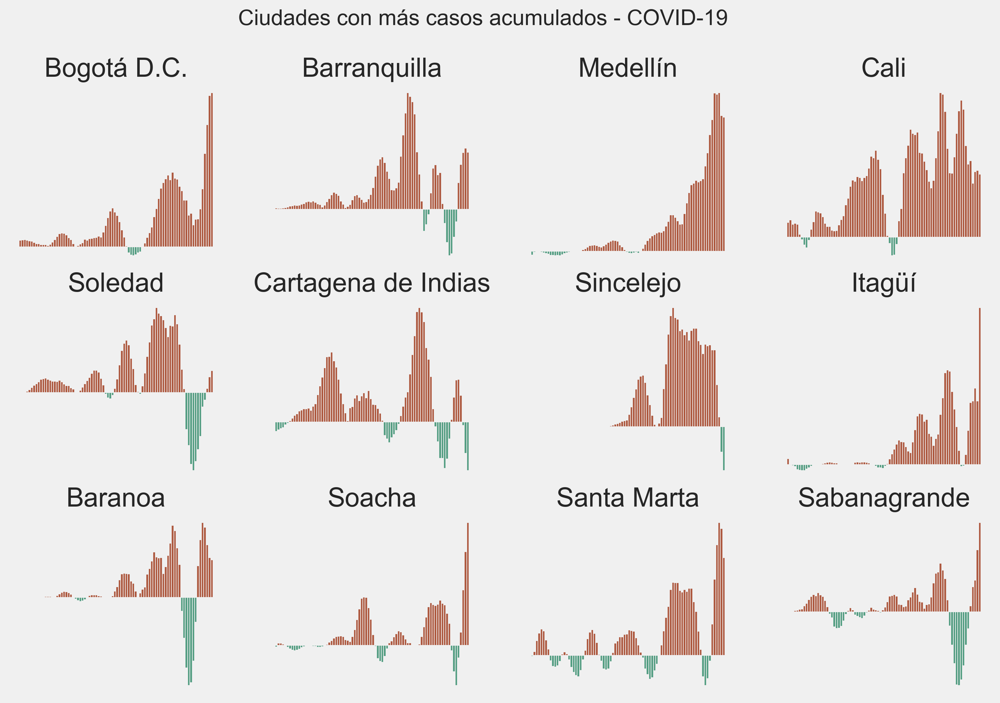

In [61]:
sns.set()
plt.style.use('fivethirtyeight')
diarios = casos.reindex( columns=casos.tail(2).mean().sort_values(ascending=False).index)
titulo = 'Ciudades con más casos acumulados - COVID-19'
ciudades = diarios.columns[:12]
plt.figure(figsize=(12,8), dpi=300)
for i, ciudad in enumerate(ciudades):
    fig = plt.subplot(3,4,i+1)
    df = diarios.iloc[-91:,i].rolling(7, min_periods=1, win_type='gaussian').mean(std=2)
    df = (df - df.shift(7)).dropna()
    #fig = sns.barplot(x = df.index, y = df , data=df)
    plt.bar(df[df>0].index, df[df>0].values, color='#ae5a41',width=1)
    plt.bar(df[df<=0].index, df[df<=0].values, color='#559e83',width=1)
    #fig = df.plot.bar()
    fig.set_title(ciudad)
    #fig.axis('off')
plt.suptitle(titulo)
#plt.savefig(f'{carpeta}{titulo}.png', bbox_inches='tight')
plt.show()